# Introduction 😃😃

### Sri Lanka House Prices Dataset

#### House Prices in Sri Lanka collected from 2021


- The Dataset contains the prices of Sri Lankan houses in all regions. Sri Lankan Real Estate related data sources are scarce and that is why created this dataset. I wanted to create this dataset so that all the data scientists out there could easily use this in their projects. The process of data collection when done manually is very tedious and is a boring process especially when there are thousands of data points. I wrote an automated script to scrape new data so that I can keep the dataset up to date.



## Mission 🙄🙄

- Can you Predictions the price home   ? 🙄🙄🙄


# Work plan ❤️

- Analyze and explore data 🤝
- Building a Machine Learning Model 🤝


# 1- Analyze and Explore DataSet 😃


In [1]:
#Importing the basic librarires fot analysis

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use("ggplot")  #using style ggplot

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import datetime as dt
import plotly.graph_objects as go
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS
import folium


In [2]:
#Importing the dataset
df =pd.read_csv("../input/sri-lanka-house-prices-dataset/house_prices.csv")


# look the data set
df.head()

,Title,Sub_title,Price,Address,Baths,Land size,Beds,House size,Location,Description,Post_URL,Seller_name,Seller_type,published_date,Geo_Address,Lat,Lon
0,House with Land for Sale in Matara for sale,"Posted on 06 Nov 2:32 pm, Matara City, Matara","Rs 5,400,000","Gangodagama Roard,Hakmana,Matara.",1,50.0 perches,3,"1,600.0 sqft","Matara City, Matara","Land for sale with house Matara,Hakmana Gangod...",https://ikman.lk/en/ad/house-with-land-for-sal...,Ishara Dilshan,Member,2021-11-06 14:32:00,"Matara City, Matara, Sri Lanka",80.500000,6.166670
1,à¶ à¶½à·à¶­à· à¶à·à¶¸à¶» 3 à¶ à¶à·à· à...,"Posted on 24 Oct 7:27 am, Athurugiriya, Colombo","Rs 16,800,000",Athurugiriya Galwarusapare,3,8.0 perches,3,"1,480.0 sqft","Athurugiriya, Colombo",*House For Sale In Athurugiriya *Galwarusapare...,https://ikman.lk/en/ad/alut-kaamr-3-k-grh-bhaa...,DILRUWAN REAL ESTATE,Premium-Member,2021-10-24 07:27:00,"Athurugiriya, Colombo, Sri Lanka",79.989929,6.877246
2,Kelaniya - House on 20P Land for sale for sale,"Posted on 17 Nov 5:19 pm, Kelaniya, Gampaha","Rs 20,000,000",Kelaniya- Ranaviru Maldeniya Road,2,20.0 perches,3,"2,800.0 sqft","Kelaniya, Gampaha","Kelaniya- Biyagama road, Ranaviru Maladeniya R...",https://ikman.lk/en/ad/kelaniya-house-on-20p-l...,Provident Paradise (Pvt) Ltd,Member,2021-11-17 17:19:00,"Kelaniya, Gampaha, Sri Lanka",79.914926,6.951178
3,House For Sale in Pamankada Lane Wellawatte Co...,"Posted on 17 Nov 5:07 pm, Colombo 6, Colombo","Rs 187,000,000",Pamankada Lane Wellawatte Colombo.06,5,22.0 perches,5,"4,000.0 sqft","Colombo 6, Colombo",22 Perches House For Sale in Pamankada Lane We...,https://ikman.lk/en/ad/house-for-sale-in-paman...,Colombo Construction Property Developers,Premium-Member,2021-11-17 17:07:00,"Colombo 6, Colombo, Sri Lanka",80.016670,6.866670
4,House For Sale - Attidiya for sale,"Posted on 17 Nov 5:06 pm, Dehiwala, Colombo","Rs 1,300,000",MainRoad Attidiya,1,6.3 perches,2,900.0 sqft,"Dehiwala, Colombo",*à¶ à¶­à·à¶­à·à¶©à·à¶º à¶´à·âà¶»à¶¯à·à·...,https://ikman.lk/en/ad/house-for-sale-attidiya...,Lakdinu Houses,Member,2021-11-17 17:06:00,"Dehiwala, Colombo, Sri Lanka",79.880242,6.838232


In [3]:
# looking the shape DataSet
df.shape

(15327, 17)

In [4]:
#Checking the dtypes of all the columns

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15327 entries, 0 to 15326
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Title           15327 non-null  object 
 1   Sub_title       15327 non-null  object 
 2   Price           15327 non-null  object 
 3   Address         11191 non-null  object 
 4   Baths           15327 non-null  object 
 5   Land size       15327 non-null  object 
 6   Beds            15327 non-null  object 
 7   House size      15327 non-null  object 
 8   Location        15327 non-null  object 
 9   Description     15327 non-null  object 
 10  Post_URL        15327 non-null  object 
 11  Seller_name     15327 non-null  object 
 12  Seller_type     15327 non-null  object 
 13  published_date  15327 non-null  object 
 14  Geo_Address     15327 non-null  object 
 15  Lat             15327 non-null  float64
 16  Lon             15327 non-null  float64
dtypes: float64(2), object(15)
memor

In [5]:
#Conversion data type column - published date from object to Datetime

df["published_date"]=pd.to_datetime(df["published_date"])

In [6]:
#Conversion data type this  columns - from object to float and drop any character 

df['Price']=df['Price'].str.replace(r'\D*',"").astype(float)
df['House size']=df['House size'].str.replace(r'\D*',"").astype(float)
df['Land size']=df['Land size'].str.replace(r'\D*',"").astype(float)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The default value of regex will change from True to False in a future version.
  """


In [7]:
#Conversion data type this  columns - from object to float 

df['Baths']=df['Baths'].str.replace(r'\D*',"").astype(float)
df['Beds']=df['Beds'].str.replace(r'\D*',"").astype(float)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  after removing the cwd from sys.path.


In [8]:
#checking null value 
df.isna().sum()

Title                0
Sub_title            0
Price                0
Address           4136
Baths                0
Land size            0
Beds                 0
House size           0
Location             0
Description          0
Post_URL             0
Seller_name          0
Seller_type          0
published_date       0
Geo_Address          0
Lat                  0
Lon                  0
dtype: int64

- we have missing value in the column Address , but don`t need this column 

In [9]:
# look  describe data set
df.describe().round(2)

,Price,Baths,Land size,Beds,House size,Lat,Lon
count,1.532700e+04,15327.00,15327.00,15327.00,15327.00,15327.00,15327.00
mean,3.534340e+07,2.98,215.64,3.99,28313.65,79.98,6.91
std,4.513401e+07,1.36,1073.22,1.25,26066.22,0.18,0.24
min,3.600000e+03,1.00,0.00,1.00,0.00,79.80,5.94
25%,1.650000e+07,2.00,80.00,3.00,16500.00,79.91,6.80
50%,2.600000e+07,3.00,100.00,4.00,25090.00,79.94,6.87
75%,3.950000e+07,4.00,150.00,4.00,33000.00,80.00,6.94
max,1.900000e+09,10.00,54450.00,10.00,1200000.00,81.82,9.67


/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


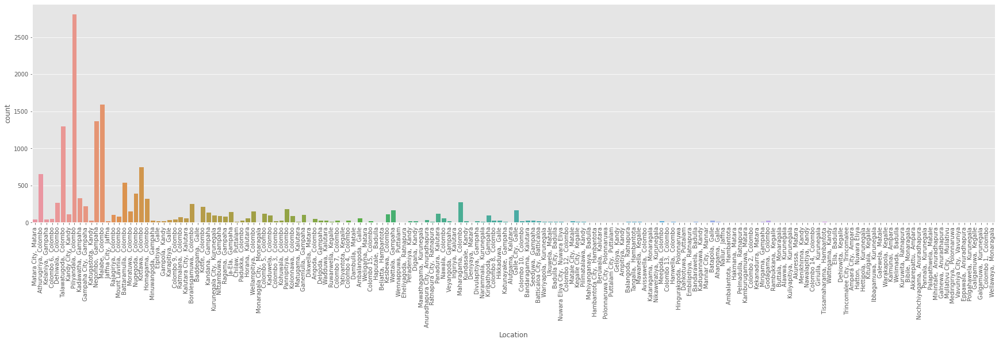

In [10]:
# how much repeat the Location  in the dataset

plt.figure(figsize=(30,7))
sns.countplot(df['Location'])
plt.xticks(rotation=90)
plt.show()

#### The highest repeat location
- Piliyandala,  Colombo      18 %
- Malabe,  Colombo           10 %
- Negombo,  Gampaha          9 %
- Talawatugoda,  Colombo     8 %
- Kottawa,  Colombo          5 %

Text(0.5, 1.0, 'The relation between number of baths and price')

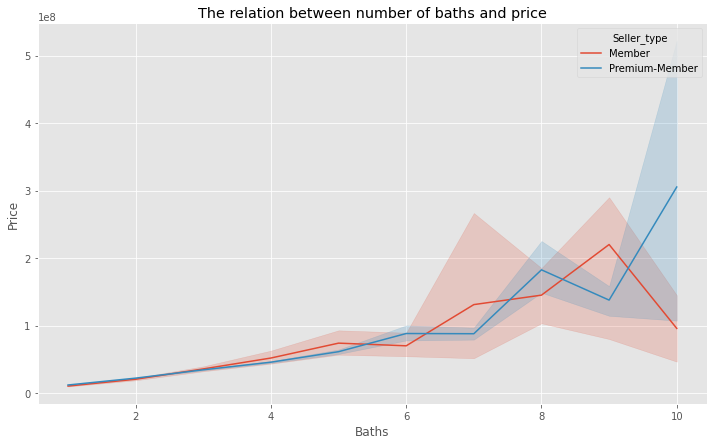

In [11]:
# show the relation between number of baths and price

plt.figure(figsize=(12,7))
sns.lineplot(data=df,x="Baths",y="Price",hue="Seller_type")
plt.title("The relation between number of baths and price")


- When increasing number bathroom increasing the price

Text(0.5, 1.0, 'The relation between number of Beds and price')

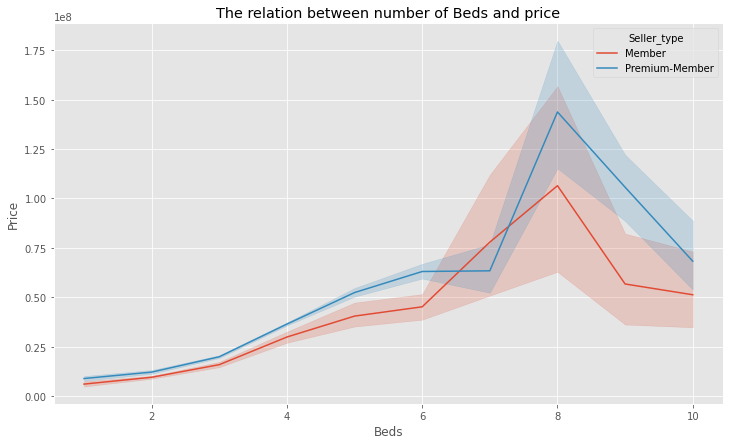

In [12]:
# show the relation between number of Beds and price

plt.figure(figsize=(12,7))

sns.lineplot(data=df,x="Beds",y="Price",hue="Seller_type")
plt.title("The relation between number of Beds and price")

- When increasing number Beds room increasing the price , but over the 8 beds room the price decreasing 

Text(0.5, 1.0, 'The relation between House size and price')

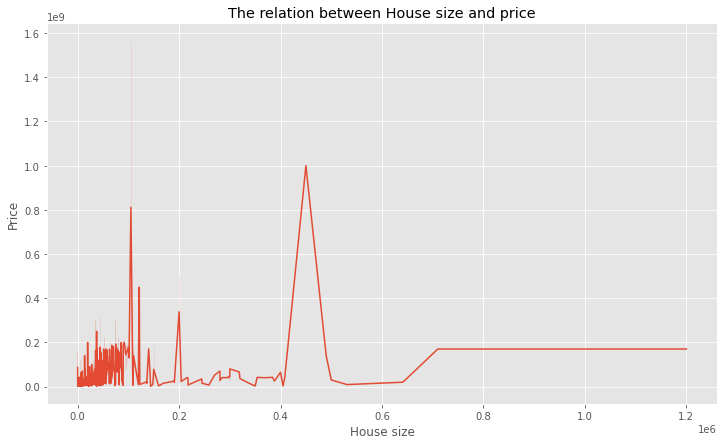

In [13]:
# show the relation between House size and price

plt.figure(figsize=(12,7))

sns.lineplot(data=df,x="House size",y="Price")
plt.title("The relation between House size and price")

In [14]:
#interactve graph

px.scatter_3d(df,x="Price",y="House size",z="Land size",color="Seller_type")


In [15]:
# make group by

df1=df.groupby("Location")["Price"].mean()
df1.sort_values().head(10)

Location
 Akkarepattu,  Ampara              9.000000e+05
 Galigamuwa,  Kegalle              2.500000e+06
 Trincomalee City,  Trincomalee    2.833333e+06
 Nallur,  Jaffna                   3.500000e+06
 Mullativu City,  Mullativu        3.700000e+06
 Wellawaya,  Monaragala            4.000000e+06
 Galgamuwa,  Kurunegala            4.100000e+06
 Buttala,  Monaragala              4.383333e+06
 Batapola,  Galle                  4.500000e+06
 Kekanadurra,  Matara              4.750000e+06
Name: Price, dtype: float64

<AxesSubplot:xlabel='Location'>

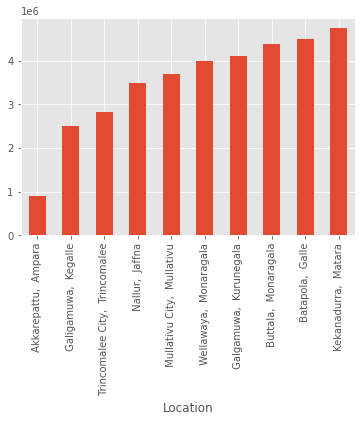

In [16]:
df1.sort_values().head(10).plot(kind="bar")

- This 10 site highest price by the location

####  Let`s show the more repeat words

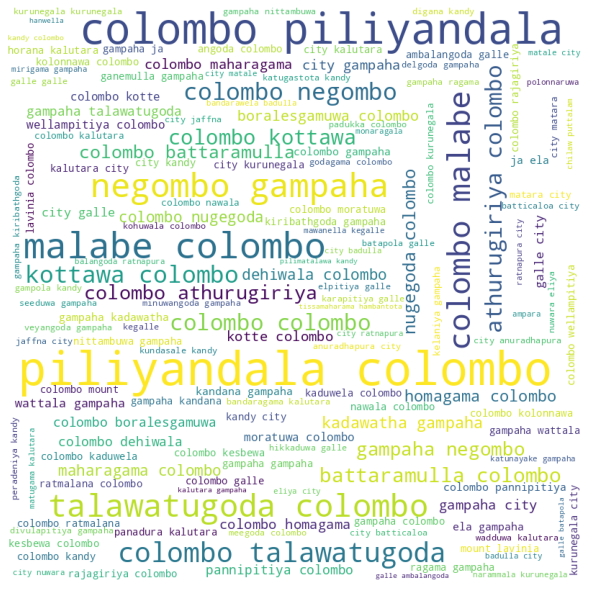

In [17]:
# repeat words location

comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in df.Location:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

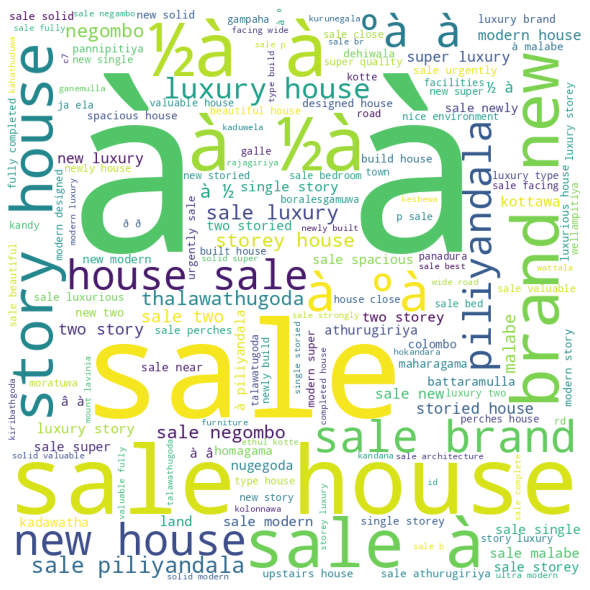

In [18]:
# repeat words Title

comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in df.Title:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

- The famous word in title [ Sale ] also symbol a

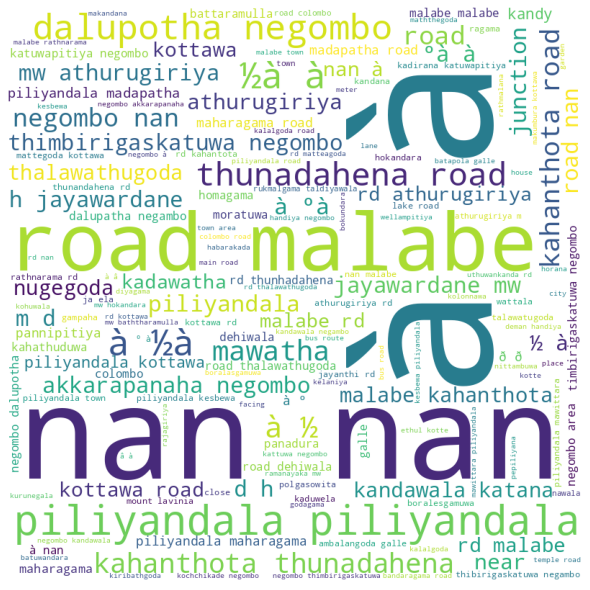

In [19]:
# repeat words Address

comment_words = ''
stopwords = set(STOPWORDS)
 
# iterate through the csv file
for val in df.Address:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

- a lot of non value in the column Address

In [20]:
# Draw the Map

sanfran_map=folium.Map(location=[7.8731, 80.7718])

incidents = folium.map.FeatureGroup()

for lat, lng, in zip(df.Lon ,df.Lat):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, 
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6,
        
        )
    )

# add incidents to map
sanfran_map.add_child(incidents)

- A lot of houses at the capital Sri Lanka

# Analysis Results😃😃😃

### Sri Lanka House Prices Dataset

### About the Location

##### The highest repeat location

- Piliyandala, Colombo 18 %
- Malabe, Colombo 10 %
- Negombo, Gampaha 9 %
- Talawatugoda, Colombo 8 %
- Kottawa, Colombo 5 %

##### This 10 site highest price by the location

- Akkarepattu,  Ampara              9.000000e+05
- Galigamuwa,  Kegalle              2.500000e+06
- Trincomalee City,  Trincomalee    2.833333e+06
- Nallur,  Jaffna                   3.500000e+06
- Mullativu City,  Mullativu        3.700000e+06
- Wellawaya,  Monaragala            4.000000e+06
- Galgamuwa,  Kurunegala            4.100000e+06
- Buttala,  Monaragala              4.383333e+06
- Batapola,  Galle                  4.500000e+06
- Kekanadurra,  Matara              4.750000e+06


### Also

- When increasing number bathroom increasing the price

- When increasing number Beds room increasing the price , but over the 8 beds room the price decreasing

- The famous word in title [ Sale ] also symbol a

- A lot of houses at the capital Sri Lanka


# 2- Building a Machine Learning Model - Regression 🙄🙄🙄

In [21]:
#Importing the basic librarires for building model


from sklearn.linear_model import LinearRegression  
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error ,mean_squared_error, median_absolute_error,confusion_matrix,accuracy_score,r2_score

from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler ,PolynomialFeatures,minmax_scale,MaxAbsScaler ,LabelEncoder,MinMaxScaler

from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor

from sklearn.svm import SVR
from xgboost import XGBRegressor

In [22]:
# change the column Seller type to numeric

df["seller_type"]=pd.get_dummies(df["Seller_type"],drop_first=True)

In [23]:
# change the column Location to numeric using label Encoder

LE=LabelEncoder()
LE.fit(df["Location"])
df["Location"]=LE.transform(df["Location"])

In [24]:
# separation the data type columns [ object and numeric ]

cat = []
num = []
for i in df.columns:
    if df[i].dtypes == 'O':
        cat.append(i)
    else:
        num.append(i)

data=df[num]  # new dataframe just type numeric
data.drop(columns="published_date",inplace=True)
data.head()

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Price,Baths,Land size,Beds,House size,Location,Lat,Lon,seller_type
0,5400000.0,1.0,500.0,3.0,16000.0,111,80.500000,6.166670,0
1,16800000.0,3.0,80.0,3.0,14800.0,11,79.989929,6.877246,1
2,20000000.0,2.0,200.0,3.0,28000.0,94,79.914926,6.951178,0
3,187000000.0,5.0,220.0,5.0,40000.0,37,80.016670,6.866670,1
4,1300000.0,1.0,63.0,2.0,9000.0,44,79.880242,6.838232,0


In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15327 entries, 0 to 15326
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Price        15327 non-null  float64
 1   Baths        15327 non-null  float64
 2   Land size    15327 non-null  float64
 3   Beds         15327 non-null  float64
 4   House size   15327 non-null  float64
 5   Location     15327 non-null  int64  
 6   Lat          15327 non-null  float64
 7   Lon          15327 non-null  float64
 8   seller_type  15327 non-null  uint8  
dtypes: float64(7), int64(1), uint8(1)
memory usage: 973.0 KB


In [26]:
data.shape

(15327, 9)

In [27]:
data.isnull().sum()

Price          0
Baths          0
Land size      0
Beds           0
House size     0
Location       0
Lat            0
Lon            0
seller_type    0
dtype: int64

- No any missing value

In [28]:
#Defined X value and y value , and split the data train
X = data.drop(columns="Price")           
y = data["Price"]    # y = quality

# split the data train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print("X Train : ", X_train.shape)
print("X Test  : ", X_test.shape)
print("Y Train : ", y_train.shape)
print("Y Test  : ", y_test.shape)

X Train :  (11495, 8)
X Test  :  (3832, 8)
Y Train :  (11495,)
Y Test  :  (3832,)


In [29]:
#Defined object from library Regression 

LR = LinearRegression()
DTR = DecisionTreeRegressor()
RFR = RandomForestRegressor()
KNR = KNeighborsRegressor()
MLP = MLPRegressor()
XGB = XGBRegressor()

In [30]:
# make for loop for Regression 

li = [LR,DTR,RFR,KNR,KNR,XGB]
d = {}
for i in li:
    i.fit(X_train,y_train)
    ypred = i.predict(X_test)
    print(i,":",r2_score(ypred,y_test)*100)
    d.update({str(i):i.score(X_test,y_test)*100})

LinearRegression() : -335.5303382384051
DecisionTreeRegressor() : 62.448884889179304
RandomForestRegressor() : 52.095409189316555
KNeighborsRegressor() : -43.86587514393101
KNeighborsRegressor() : -43.86587514393101
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None) : 69.44344258153569


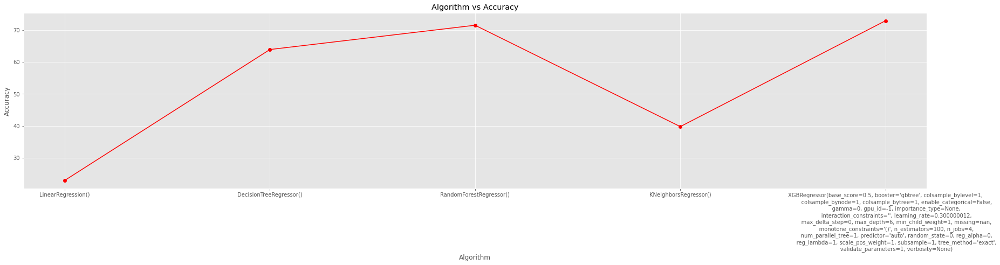

In [31]:
# make graph about Accuracy

plt.figure(figsize=(30, 6))
plt.title("Algorithm vs Accuracy")
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")
plt.plot(d.keys(),d.values(),marker='o',color='red')
plt.show()

## we see the best modle XGB 

### Normalization

In [32]:
# fit scaler on training data
normalization = MinMaxScaler().fit(X_train)
# transform training data
X_train_n = normalization.transform(X_train)
# transform testing data
X_test_n = normalization.transform(X_test)

In [33]:
li = [LR,DTR,RFR,KNR,KNR,XGB]
di = {}
for i in li:
    i.fit(X_train_n,y_train)
    ypred = i.predict(X_test_n)
    print(i,":",r2_score(ypred,y_test)*100)
    di.update({str(i):i.score(X_test_n,y_test)*100})

LinearRegression() : -335.53033823840997
DecisionTreeRegressor() : 55.23214513488729
RandomForestRegressor() : 53.60954399471463
KNeighborsRegressor() : -29.26441348472977
KNeighborsRegressor() : -29.26441348472977
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None) : 69.39023241545662


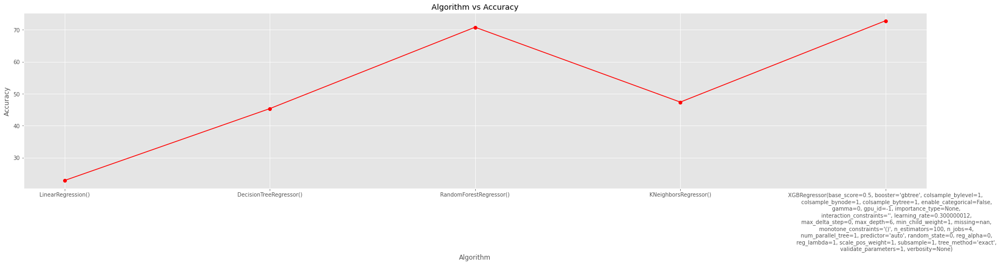

In [34]:
# make graph about Accuracy after normalization
 
plt.figure(figsize=(30, 6))
plt.title("Algorithm vs Accuracy")
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")
plt.plot(di.keys(),di.values(),marker='o',color='red')
plt.show()

In [35]:
# fit scaler on training data
std = StandardScaler().fit(X_train)
# transform train data
x_train_std = std.transform(X_train)
# transform test data
x_test_std = std.transform(X_test)

In [36]:
li = [LR,DTR,RFR,KNR,KNR,XGB]
dis = {}
for i in li:
    i.fit(x_train_std,y_train)
    ypred = i.predict(x_test_std)
    print(i,":",r2_score(ypred,y_test)*100)
    dis.update({str(i):i.score(x_test_std,y_test)*100})

LinearRegression() : -335.5303382384092
DecisionTreeRegressor() : 55.12613945052364
RandomForestRegressor() : 54.818621845009396
KNeighborsRegressor() : -25.435746234907807
KNeighborsRegressor() : -25.435746234907807
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None) : 69.4548242674324


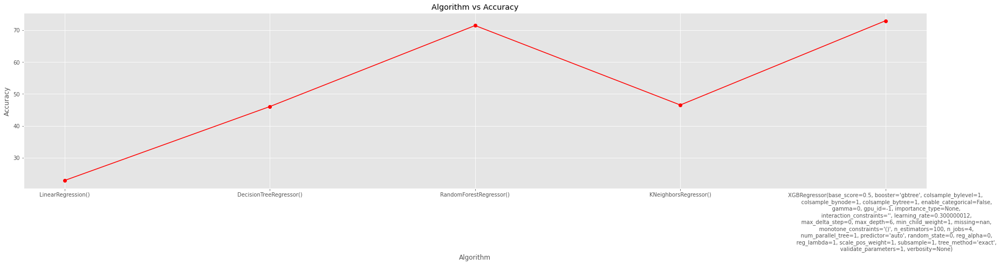

In [37]:
# make graph about Accuracy after normalization -Standard Scaler
 
plt.figure(figsize=(30, 6))
plt.title("Algorithm vs Accuracy")
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")
plt.plot(dis.keys(),dis.values(),marker='o',color='red')
plt.show()

## The best Algorithm XGBRegressor

# Model Selection Results 😃😃😃

- So , the best model XGB Regressor Model around 70 %


# Notes 😃😃😃😃

- Thank for reading my analysis and my regression. 😃😃😃😃

- If you any questions or advice me please write in the comment . ❤️❤️❤️❤️

- If anyone has a model with a higher percentage, please tell me 🤝🤝🤝


# Vote ❤️😃

- If you liked my work upvote me ,



# The End 🤝🎉🤝🎉